<a href="https://colab.research.google.com/github/Juan-Garassino/maze-reinforcement-learning/blob/master/q-learning-original" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports

In [101]:
import numpy as np
from collections import defaultdict
from PIL import Image, ImageDraw, ImageFont
from IPython import display
import IPython.display
import pandas as pd
import seaborn as sns

# Config

In [102]:
WIDTH = 15
HEIGHT = 15
DENSITY = 0.08

In [103]:
REWARD_WIN = 1000
REWARD_LOSE = -5000
REWARD_STEP = -10
REWARD_REPEAT = -500

In [104]:
VISION_DISTANCE = 2

# Generate mazes

In [105]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [106]:
SPRITE_SIZE = 32

In [107]:
def crop(input_image, height, width):
    im = Image.open(input_image)
    imgwidth, imgheight = im.size
    images = []
    
    for i in range(0, imgheight, height):
        for j in range(0, imgwidth, width):
            box = (j, i, j + width, i + height)
            a = im.crop(box)
            a = a.resize((SPRITE_SIZE, SPRITE_SIZE), Image.ANTIALIAS)
            images.append(a)
            a.show()
    return images

MAZE_IMAGES = crop('/content/drive/MyDrive/Notebooks/Projects/Pictures/cave.png', 16, 16)
MAZE_IMAGES

[<PIL.Image.Image image mode=RGBA size=32x32 at 0x7F114870FF98>,
 <PIL.Image.Image image mode=RGBA size=32x32 at 0x7F114870F940>,
 <PIL.Image.Image image mode=RGBA size=32x32 at 0x7F114870FBE0>,
 <PIL.Image.Image image mode=RGBA size=32x32 at 0x7F114870FAC8>,
 <PIL.Image.Image image mode=RGBA size=32x32 at 0x7F114870FC18>,
 <PIL.Image.Image image mode=RGBA size=32x32 at 0x7F114870FB70>,
 <PIL.Image.Image image mode=RGBA size=32x32 at 0x7F11B999C390>,
 <PIL.Image.Image image mode=RGBA size=32x32 at 0x7F11480C1908>,
 <PIL.Image.Image image mode=RGBA size=32x32 at 0x7F11480C1A90>,
 <PIL.Image.Image image mode=RGBA size=32x32 at 0x7F11480C1A58>,
 <PIL.Image.Image image mode=RGBA size=32x32 at 0x7F11480C1AC8>,
 <PIL.Image.Image image mode=RGBA size=32x32 at 0x7F11480C1E80>,
 <PIL.Image.Image image mode=RGBA size=32x32 at 0x7F11480C1C88>,
 <PIL.Image.Image image mode=RGBA size=32x32 at 0x7F11480C18D0>,
 <PIL.Image.Image image mode=RGBA size=32x32 at 0x7F11480C19B0>,
 <PIL.Image.Image image m

In [108]:
MAZE_IMAGES = crop('/content/drive/MyDrive/Notebooks/Projects/Pictures/cave.png', 16, 16)
MAZE_IMAGES = MAZE_IMAGES + crop('/content/drive/MyDrive/Notebooks/Projects/Pictures/objects.png', 16, 16)
MAZE_IMAGES = MAZE_IMAGES + [Image.open('/content/drive/MyDrive/Notebooks/Projects/Pictures/agus.png').resize((SPRITE_SIZE, SPRITE_SIZE), Image.ANTIALIAS)]

In [109]:
IMAGEN_POZO = 16 * 8 + 2
IMAGEN_TIERRA = 16 * 9
IMAGEN_LAVA = 16 * 20
IMAGEN_SALIDA = 378
IMAGEN_TIPO = -1

In [110]:
MAZE_IMAGES = [
    MAZE_IMAGES[IMAGEN_POZO],
    MAZE_IMAGES[IMAGEN_TIERRA],
    MAZE_IMAGES[IMAGEN_LAVA],
    MAZE_IMAGES[IMAGEN_SALIDA],
    MAZE_IMAGES[IMAGEN_TIPO],
]

In [111]:
IMAGEN_POZO = 0
IMAGEN_TIERRA = 1
IMAGEN_LAVA = 2
IMAGEN_SALIDA = 3
IMAGEN_TIPO = 4

In [112]:
CODE_TREASURE = 1
CODE_EMPTY = 0
CODE_HOLE = -1

In [113]:
INITIAL_POSITION = (1, 1)

In [114]:
def generate_maze(m, n, density=DENSITY):
    maze = np.random.choice([CODE_EMPTY, CODE_HOLE], m * n, p=[1.0 - density, density]).reshape((m, n))
    maze[m - 2, n - 2] = CODE_TREASURE
    maze[INITIAL_POSITION] = CODE_EMPTY
    for i in range(m):
        maze[i, 0] = CODE_HOLE
        maze[i, n - 1] = CODE_HOLE
    for j in range(n):
        maze[0, j] = CODE_HOLE
        maze[m - 1, j] = CODE_HOLE
    flip_horizontal = np.random.choice([-1, 1])
    flip_vertical = np.random.choice([-1, 1])
    
    return maze[::flip_horizontal, ::flip_vertical]

In [115]:
class GifMaze(object):
    def __init__(self):
        self.mazes = []
        self.images = []
        
    def add(self, maze, position):
        self.mazes.append((maze, position))
    
    def show(self):
        frames = []
        time = 0
        for maze, position in self.mazes:
            img = Image.new('RGB', (maze.shape[0] * SPRITE_SIZE, maze.shape[1] * SPRITE_SIZE), color = (0, 0, 0))
            convert = {CODE_EMPTY: IMAGEN_TIERRA, CODE_HOLE: IMAGEN_POZO, CODE_TREASURE: IMAGEN_SALIDA}
            for height in range(maze.shape[1]):
                for width in range(maze.shape[0]):
                    if (width, height) == position:
                        img.paste(MAZE_IMAGES[IMAGEN_TIPO], (width * SPRITE_SIZE, height * SPRITE_SIZE))
                    else:
                        img.paste(MAZE_IMAGES[convert[maze[width, height]]], (width * SPRITE_SIZE, height * SPRITE_SIZE))
            draw = ImageDraw.Draw(img)
            draw.text((SPRITE_SIZE * (maze.shape[0] - 1) - 10, 10), "t = %s" % time, (255, 255,255))
            time += 1
            frames.append(img)
            
        frames[0].save('moving_maze.gif.png', format='GIF', append_images=frames[1:], save_all=True, duration=len(frames) * 12, loop=0)
        IPython.display.display(display.Image(filename="moving_maze.gif.png"))

In [116]:
def colors_for_values(values):
    colors = [(255, 255, 255) for _ in range(4)]
    colors[np.argmax(values)] = (0, 255, 0)
    colors[np.argmin(values)] = (255, 0, 0)
    return colors

In [117]:
DURATION_GIF = 100

In [118]:
class GifMazeRewards(object):
    @classmethod
    def from_other(cls, gif_maze):
        return cls(mazes=gif_maze.mazes)
    
    def __init__(self, mazes):
        self.mazes = mazes
        self.images = []
        
    def add(self, maze, position):
        self.mazes.append((maze, position))
        
    def show_model(self, player):
        frames = []
        time = 0
        font = ImageFont.load_default()
        for maze, position in self.mazes:
            img = Image.new('RGB', (maze.shape[0] * SPRITE_SIZE, maze.shape[1] * SPRITE_SIZE), color = (0, 0, 0))
            draw = ImageDraw.Draw(img)
            convert = {CODE_EMPTY: IMAGEN_TIERRA, CODE_HOLE: IMAGEN_POZO, CODE_TREASURE: IMAGEN_SALIDA}
            for height in range(maze.shape[1]):
                for width in range(maze.shape[0]):
                    if (width, height) == position:
                        img.paste(MAZE_IMAGES[IMAGEN_TIPO], (width * SPRITE_SIZE, height * SPRITE_SIZE))
                    else:
                        img.paste(MAZE_IMAGES[convert[maze[width, height]]], (width * SPRITE_SIZE, height * SPRITE_SIZE))
                    
            state = position + vision_from(maze, position) + tuple([1 for a in POSSIBLE_ACTIONS])
            draw.text((SPRITE_SIZE * (maze.shape[0] - 1) - 10, 10), "t = %s" % time, (255, 255,255))
            
            values = player.estimates_for(state)
            colors = colors_for_values(values)
 
            center_y = 25
            center_x = img.size[0] / 2
            bias = 20
            
            draw.text((center_x, center_y - bias), "%.0f" % values[0], colors[0])
            draw.text((center_x, center_y + bias), "%.0f" % values[1], colors[1])
            draw.text((center_x - bias, center_y), "%.0f" % values[2], colors[2])
            draw.text((center_x + bias, center_y), "%.0f" % values[3], colors[3])
            time += 1
            frames.append(img)
            
        frames[0].save('moving_maze.gif.png', format='GIF', append_images=frames[1:], save_all=True, duration=len(frames) * DURATION_GIF, loop=0)
        IPython.display.display(display.Image(filename="moving_maze.gif.png"))
    
    def show(self, Q_table):
        frames = []
        time = 0
        font = ImageFont.load_default()
        for maze, position in self.mazes:
            img = Image.new('RGB', (maze.shape[0] * SPRITE_SIZE, maze.shape[1] * SPRITE_SIZE), color = (0, 0, 0))
            draw = ImageDraw.Draw(img)
            convert = {CODE_EMPTY: IMAGEN_TIERRA, CODE_HOLE: IMAGEN_POZO, CODE_TREASURE: IMAGEN_SALIDA}
            for height in range(maze.shape[1]):
                for width in range(maze.shape[0]):
                    if (width, height) == position:
                        img.paste(MAZE_IMAGES[IMAGEN_TIPO], (width * SPRITE_SIZE, height * SPRITE_SIZE))
                    else:
                        img.paste(MAZE_IMAGES[convert[maze[width, height]]], (width * SPRITE_SIZE, height * SPRITE_SIZE))
                    
            state = position + vision_from(maze, position) + tuple([1 for a in POSSIBLE_ACTIONS])
            draw.text((SPRITE_SIZE * (maze.shape[0] - 1) - 10, 10), "t = %s" % time, (255, 255,255))
            
            colors = colors_for_values([Q_table[(i, state)] for i in range(4)])
            
            center_y = 25
            center_x = img.size[0] / 2
            bias = 20
            
            draw.text((center_x, center_y - bias), "%.0f" % Q_table[(0, state)], colors[0])
            draw.text((center_x, center_y + bias), "%.0f" % Q_table[(1, state)], colors[1])
            draw.text((center_x - bias, center_y), "%.0f" % Q_table[(2, state)], colors[2])
            draw.text((center_x + bias, center_y), "%.0f" % Q_table[(3, state)], colors[3])
            time += 1
            frames.append(img)
            
        frames[0].save('moving_maze.gif.png', format='GIF', append_images=frames[1:], save_all=True, duration=len(frames) * DURATION_GIF, loop=0)
        IPython.display.display(display.Image(filename="moving_maze.gif.png"))

In [119]:
def show_maze(maze, position):
    s = ""
    convert = {CODE_EMPTY: '_', CODE_HOLE: 'X', CODE_TREASURE: '$'}
    for height in range(maze.shape[1]):
        for width in range(maze.shape[0]):
            if (width, height) == position:
                s += "8"
            else:
                s += convert[maze[width, height]]
        s += '\n'
    print(s)  

In [120]:
generate_maze(WIDTH, HEIGHT, 0.2)

array([[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1],
       [-1,  1,  0, -1, -1,  0, -1,  0,  0,  0,  0, -1, -1, -1, -1],
       [-1,  0,  0,  0,  0, -1, -1,  0,  0,  0,  0,  0,  0,  0, -1],
       [-1,  0, -1,  0,  0,  0,  0,  0,  0, -1,  0, -1,  0,  0, -1],
       [-1,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0, -1,  0,  0, -1],
       [-1,  0,  0, -1, -1,  0,  0,  0,  0,  0,  0, -1,  0, -1, -1],
       [-1,  0,  0, -1,  0, -1,  0,  0,  0,  0, -1,  0,  0,  0, -1],
       [-1,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0, -1,  0,  0, -1],
       [-1,  0,  0,  0, -1,  0, -1,  0,  0,  0,  0,  0,  0,  0, -1],
       [-1, -1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0, -1],
       [-1,  0, -1,  0,  0,  0,  0, -1, -1, -1, -1, -1,  0,  0, -1],
       [-1, -1,  0,  0,  0,  0,  0,  0,  0, -1,  0, -1,  0,  0, -1],
       [-1,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0, -1],
       [-1, -1,  0, -1,  0,  0,  0, -1,  0,  0,  0,  0, -1,  0, -1],
       [-1, -1, -1, -1, -1, -1, -1

# Game

In [121]:
UP = 0
DOWN = 1
LEFT = 2
RIGHT = 3

In [122]:
CONVERT_DIRECTIONS = {UP: 'UP', DOWN: 'DOWN', LEFT: 'LEFT', RIGHT: 'RIGHT'}

In [123]:
POSSIBLE_ACTIONS = [UP, DOWN, LEFT, RIGHT]

In [124]:
def choose_action(Q_table, state):
    taken_action = None
    current_value = None
    for action in POSSIBLE_ACTIONS:
        possible_value = Q_table[(action, state)]
        if taken_action is None or possible_value >= current_value:
            current_value = possible_value
            taken_action = action
    return taken_action, current_value

In [125]:

class Player(object):
    def __init__(self):
        self.i = 0
        
    def move(self, state):
        raise NotImplementedError("Subclass responsibility")
        
class RandomPlayer(Player):
    def move(self, state):
        return np.random.choice(POSSIBLE_ACTIONS)
    
class QPlayer(Player):
    def __init__(self, Q, explore_factor):
        self.Q = Q
        self.explore_factor = explore_factor
        super(QPlayer, self).__init__()
        
    def move(self, state):
        if np.random.uniform(0, 1) > self.explore_factor:
            self.i += 1
            taken_action, current_value = choose_action(self.Q, state)
            return taken_action
        return RandomPlayer().move(state)

In [126]:
def apply_action(position, action):
    if action == UP:
        return (position[0], max(position[1] - 1, 0))
    elif action == DOWN:
        return (position[0], min(position[1] + 1, HEIGHT - 1))
    elif action == LEFT:
        return (max(position[0] - 1, 0), position[1])
    elif action == RIGHT:
        return (min(position[0] + 1, WIDTH - 1), position[1])
    raise Exception("Action %s not understood." % action)

In [127]:
def vision_from(maze, position, max_distance=VISION_DISTANCE):
    vision = []
    for distance in range(1, max_distance + 1):
        vision += [
            maze[position[0], position[1] - distance] if position[1] - distance >= 0 else 1,
            maze[position[0], position[1] + distance] if position[1] + distance < maze.shape[1] else 1,
            maze[position[0] - distance, position[1]] if position[0] - distance >= 0 else 1,
            maze[position[0] + distance, position[1]] if position[0] + distance < maze.shape[0] else 1
        ]
    return tuple(vision)

In [128]:
def play(maze, player, verbose=False, show_gif=False):
    position = INITIAL_POSITION
    observations = []
    reward = 0.0
    result = None
    memory = defaultdict(lambda: 0)
    memory[INITIAL_POSITION] = 1
    
    if verbose:
        show_maze(maze, position)
        
    if show_gif:
        gif_maze = GifMaze()
        gif_maze.add(maze.copy(), position)
    
    while True:
        reward = REWARD_STEP

        if verbose:
            print('')
            print('Comienzo Turno:')
        old_state = position + vision_from(maze, position) + tuple([memory[apply_action(position, a)] for a in POSSIBLE_ACTIONS])
        
        if show_gif:
            gif_maze.add(maze.copy(), position)
            
        if verbose:
            print(' * Estado viejo: %s' % list(old_state))
        action = player.move(old_state)
        
        if verbose:
            print(' * Action: %s' % CONVERT_DIRECTIONS[action])
            if hasattr(player, 'Q'):
                print(' * Value: %s' % choose_action(player.Q, old_state)[1])
                
        position = apply_action(position, action)
        if memory[position] == 1:
            reward = REWARD_REPEAT
            
        memory[position] = 1
        
        new_state = position + vision_from(maze, position) + tuple([memory[apply_action(position, a)] for a in POSSIBLE_ACTIONS])
        
        if verbose:
            print(' * Estado nuevo: %s' % list(new_state))
                
        if verbose:
            show_maze(maze, position)
        
        if maze[position] == CODE_HOLE:
            reward = REWARD_LOSE
            result = 'lose'
            observations.append((old_state, action, reward, new_state))
            break
        elif maze[position] == CODE_TREASURE:
            reward = REWARD_WIN
            result = 'win'
            if verbose:
                print('cantidad explotadas %s' % player.i)
                print('gane %s' % len(observations))
                print('%% explotadas: %.2f' % (player.i / len(observations)))
            observations.append((old_state, action, reward, new_state))
            break
        

        observations.append((old_state, action, reward, new_state))
        
    if show_gif:
        gif_maze.add(maze.copy(), position)
        gif_maze.show()
        if hasattr(player, 'Q'):
            GifMazeRewards.from_other(gif_maze).show(player.Q)
        elif hasattr(player, 'model'):
            GifMazeRewards.from_other(gif_maze).show_model(player)
            
    return observations, result

# Random

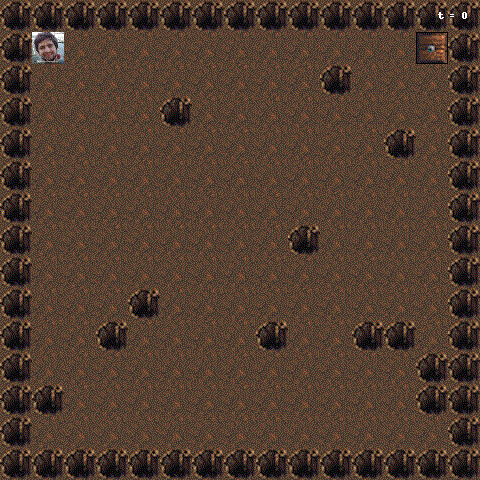

lose


In [129]:
maze = generate_maze(WIDTH, HEIGHT)
random_player = RandomPlayer()
observations, result = play(maze, random_player, show_gif=True)
print(result)

# Q Learning

In [130]:
def q_learning(Q, observations, learning_rate=0.2, discount_factor=0.95):
    for observation in observations:
        old_state, action, reward, new_state = observation
        
        _, estimated_future_value = choose_action(Q, new_state)
        current_value = Q[(action, old_state)]
        
        Q[(action, old_state)] = current_value + learning_rate * (reward + discount_factor * estimated_future_value - current_value)
    return Q

In [131]:
print(_)

[[-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]
 [-1  1  0 -1 -1  0 -1  0  0  0  0 -1 -1 -1 -1]
 [-1  0  0  0  0 -1 -1  0  0  0  0  0  0  0 -1]
 [-1  0 -1  0  0  0  0  0  0 -1  0 -1  0  0 -1]
 [-1  0  0  0 -1  0  0  0  0  0  0 -1  0  0 -1]
 [-1  0  0 -1 -1  0  0  0  0  0  0 -1  0 -1 -1]
 [-1  0  0 -1  0 -1  0  0  0  0 -1  0  0  0 -1]
 [-1  0  0  0  0  0  0  0  0 -1  0 -1  0  0 -1]
 [-1  0  0  0 -1  0 -1  0  0  0  0  0  0  0 -1]
 [-1 -1  0  0  0  0  0  0  0  0  0  0 -1  0 -1]
 [-1  0 -1  0  0  0  0 -1 -1 -1 -1 -1  0  0 -1]
 [-1 -1  0  0  0  0  0  0  0 -1  0 -1  0  0 -1]
 [-1  0  0  0  0  0  0  0  0 -1  0  0  0  0 -1]
 [-1 -1  0 -1  0  0  0 -1  0  0  0  0 -1  0 -1]
 [-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]]


In [132]:
def train_q_learning(q_player, amount_games):
    for game_number in range(amount_games):
        maze = generate_maze(WIDTH, HEIGHT)

        observations, result = play(maze, q_player)
        old_Q = q_player.Q.copy()
        new_Q = q_learning(q_player.Q, observations)
        
        # Convergence:
        if game_number % 5000 == 0:
            convergence = sum([abs(old_Q[key] - new_Q[key]) for key in old_Q.keys()])
            print('Game: %s | Convergence: %.2f' % (game_number, convergence))
            # play(maze, q_player)
            
        q_player = QPlayer(new_Q, explore_factor=0.05)
    return q_player

In [133]:
q_player = QPlayer(defaultdict(lambda: 0), explore_factor=1.0)
q_player = train_q_learning(q_player, amount_games=60000)
print(result)

Game: 0 | Convergence: 0.00
Game: 5000 | Convergence: 1075.05
Game: 10000 | Convergence: 159.95
Game: 15000 | Convergence: 347.66
Game: 20000 | Convergence: 170.60
Game: 25000 | Convergence: 167.42
Game: 30000 | Convergence: 7.76
Game: 35000 | Convergence: 4082.37
Game: 40000 | Convergence: 148.54
Game: 45000 | Convergence: 157.16
Game: 50000 | Convergence: 901.07
Game: 55000 | Convergence: 180.24
lose


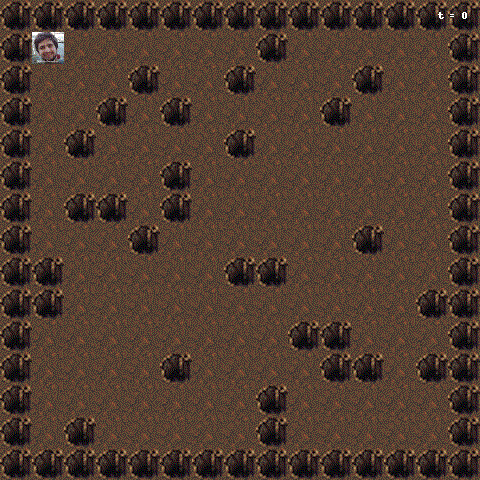

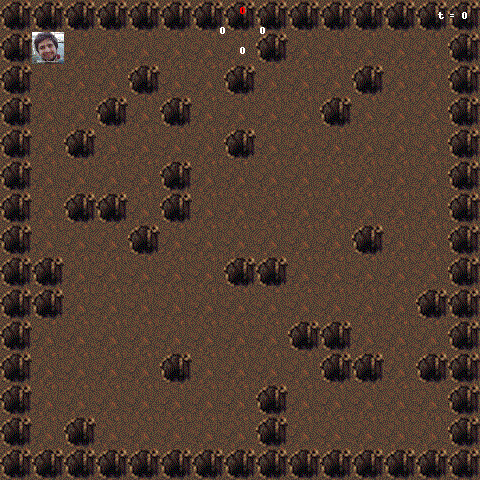

win


In [134]:
maze = generate_maze(WIDTH, HEIGHT, density=0.2)
q_player = QPlayer(q_player.Q, explore_factor=0.00)
observations, result = play(maze, q_player, show_gif = True) # Here I pass the maza and the player
print(result)

# Deep Q Learning

In [135]:
from keras.models import Sequential
from keras.layers import Dense, BatchNormalization, Dropout
from keras.optimizers import RMSprop, Adam

In [136]:
STATE_LENGTH = len(POSSIBLE_ACTIONS) + 2 + VISION_DISTANCE * 4 + 4

In [137]:
model = Sequential()
model.add(Dense(16, input_dim=STATE_LENGTH, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.25))
model.add(Dense(32, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.25))
model.add(Dense(32, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(16, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.4))
model.add(Dense(1, activation='linear'))
model.compile(loss= "mean_squared_error" , optimizer=RMSprop(), metrics=["mean_squared_error", "mean_absolute_error"])

In [138]:
print(model.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 16)                304       
_________________________________________________________________
batch_normalization (BatchNo (None, 16)                64        
_________________________________________________________________
dropout (Dropout)            (None, 16)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 32)                544       
_________________________________________________________________
batch_normalization_1 (Batch (None, 32)                128       
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 32)                1

In [139]:
class DeepPlayer(Player):
    def __init__(self, model, mean=None, std=None, explore_factor=0.05):
        self.model = model
        self.mean = mean if mean is not None else np.zeros(STATE_LENGTH)
        self.std = std if std is not None else np.ones(STATE_LENGTH)
        self.explore_factor = explore_factor
        super(DeepPlayer, self).__init__()
        
    def estimates_for(self, state):
        input_matrix = np.concatenate([
            np.eye(len(POSSIBLE_ACTIONS)),
            np.kron(np.ones(len(POSSIBLE_ACTIONS)), np.array(state)).reshape((len(POSSIBLE_ACTIONS), len(state)))
        ], axis=1)
        return model.predict((input_matrix - self.mean) / self.std)
    
    def move(self, state):
        if np.random.uniform(0, 1) > self.explore_factor:
            self.i += 1
            return np.argmax(self.estimates_for(state))
        return RandomPlayer().move(state)

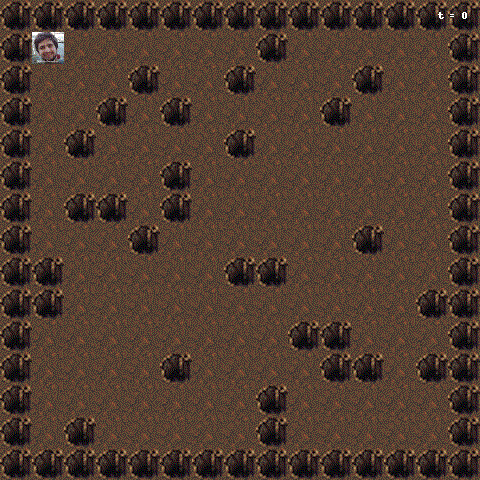

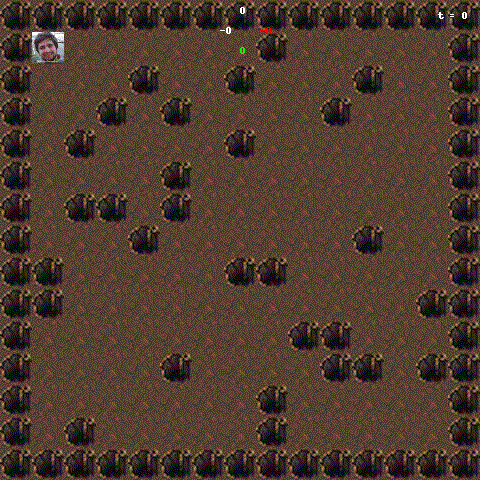

lose


In [140]:
deep_player = DeepPlayer(model, explore_factor=0.5)
obs, result = play(maze, deep_player, show_gif=True)
print(result)

In [141]:
def train_deep_q_learning(deep_player, discount_factor=0.95, explore_factor=0.05, density=DENSITY, amount_batches=10, batch_size=500):
    mean = None
    std = None
    alpha = 0.05
    
    for batch_number in range(amount_batches):
        observations = []
        results = []
        while len(observations) < batch_size:
            maze = generate_maze(WIDTH, HEIGHT, density=density)
            obs, res = play(maze, deep_player)
            observations += obs
            results.append(res)
        
        # Generate samples from observations
        X_train = []
        y_train = []
        for observation in observations:
            old_state, action, reward, new_state = observation
            
            X_train.append(np.concatenate([np.eye(len(POSSIBLE_ACTIONS))[action].reshape((1, len(POSSIBLE_ACTIONS))), np.array(old_state).reshape((1, len(old_state)))], axis=1))
            y_train.append(discount_factor * np.max(deep_player.estimates_for(new_state)) + reward)
        
        # Train
        X_train = np.concatenate(X_train)
        y_train = np.array(y_train).reshape((-1 , 1))
        
        if mean is None:
            mean = X_train.mean(axis=0)
            std = X_train.std(axis=0)
        else:
            mean = mean * (1 - alpha) + alpha * X_train.mean(axis=0)
            std = std * (1 - alpha) + alpha * X_train.std(axis=0)
        
        std[std == 0] = float('inf')
        X_train = (X_train - mean) / std
        
        win_ratio = (100 * len([x for x in results if x == 'win']) / len(results))
        
        history = deep_player.model.fit(X_train, y_train, verbose=0, batch_size=32, epochs=100)
        deep_player = DeepPlayer(deep_player.model, mean=mean, std=std, explore_factor=explore_factor)
        
        print('')
        print('-------------------')
        print('Batch number: %s' % batch_number)
        print('Win ratio: %.2f%%' % win_ratio)
        print('Loss: %s' % history.history['mean_absolute_error'][-4:])
        print('Rewards:')
        print(pd.DataFrame([obs[2] for obs in observations])[0].value_counts())
        print('')
        
    return deep_player

In [142]:
deep_player = train_deep_q_learning(deep_player, amount_batches=15, density=0.025, explore_factor=0.4, batch_size=1000)


-------------------
Batch number: 0
Win ratio: 2.55%
Loss: [969.2340698242188, 963.5242919921875, 962.1166381835938, 965.4495849609375]
Rewards:
-10      613
-500     199
-5000    191
 1000      5
Name: 0, dtype: int64


-------------------
Batch number: 1
Win ratio: 4.88%
Loss: [281.4467468261719, 310.1443176269531, 293.51025390625, 308.45098876953125]
Rewards:
-10      631
-500     332
-5000     39
 1000      2
Name: 0, dtype: int64


-------------------
Batch number: 2
Win ratio: 8.11%
Loss: [261.0794982910156, 281.861572265625, 278.8968811035156, 274.8534240722656]
Rewards:
-10      769
-500     217
-5000     34
 1000      3
Name: 0, dtype: int64


-------------------
Batch number: 3
Win ratio: 2.86%
Loss: [275.8578186035156, 255.18202209472656, 255.77264404296875, 269.5315246582031]
Rewards:
-10      787
-500     185
-5000     34
 1000      1
Name: 0, dtype: int64


-------------------
Batch number: 4
Win ratio: 6.45%
Loss: [260.17291259765625, 263.7471618652344, 294.878204345703

In [143]:
#deep_player = train_deep_q_learning(deep_player, amount_batches=15, density=0.1, explore_factor=0.05, batch_size=1000)

In [144]:
my_new_maze = np.array(
    [[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1],
     [-1,  0,  0, -1, -1,  0,  0,  0,  0, -1],
     [-1, -1,  0,  0, -1, -1,  0, -1, -1, -1],
     [-1,  0, -1,  0,  0,  0,  0,  0,  0, -1],
     [-1, -1,  0,  0, -1, -1,  0, -1, -1, -1],
     [-1,  0, -1,  0, -1,  0,  0,  0,  0, -1],
     [-1, -1,  0,  0, -1, -1,  0,  0,  0, -1],
     [-1,  0,  0, -1,  0,  0, -1, -1, -1, -1],
     [-1, -1,  0, -1,  0,  0, -1,  0,  0, -1],
     [-1, -1,  0, -1, -1,  0, -1,  0, -1, -1],
     [-1,  0,  0,  0,  0, -1,  0,  0, -1, -1],
     [-1, -1,  0, -1,  0, -1,  0,  0,  0, -1],
     [-1,  0,  0, -1,  0,  0, -1, -1, -1, -1],
     [-1, -1,  0, -1,  0,  0,  0,  0,  0, -1],
     [-1, -1,  0, -1, -1, -1, -1,  0, -1, -1],
     [-1,  0,  0,  0,  0,  0,  0,  0,  1, -1],
     [-1, -1, -1, -1, -1, -1, -1, -1, -1, -1]]).T

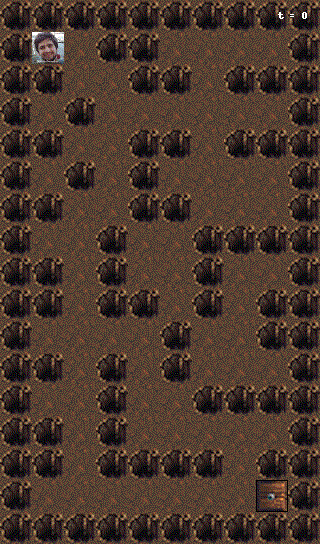

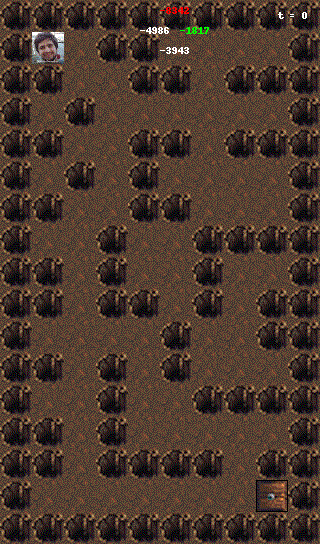

lose


In [145]:
my_player = DeepPlayer(deep_player.model, mean = deep_player.mean, std = deep_player.std, explore_factor = 0.0)
_, result = play(my_new_maze, my_player, show_gif=True)
print(result)

In [146]:
#my_maze = generate_maze(WIDTH, HEIGHT, density=0.5)
#my_player = DeepPlayer(deep_player.model, mean=deep_player.mean, std=deep_player.std, explore_factor=0.0)
#_, result = play(my_maze, my_player, show_gif=True)
#print(result)